In [247]:
from pyretri.models.backbone import HyperbolicBackbone, autoencoder
import os
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from sklearn.manifold import TSNE
import torchvision
from torch.autograd import Variable
from collections import defaultdict
from tqdm.auto import tqdm

In [24]:
hyperbolic_model = HyperbolicBackbone('/home/artem/dev/CBIR-v2/libs/UnHyperML/save_dir/ckp_ep1000.pth.tar')

=> Loaded checkpoint '/home/artem/dev/CBIR-v2/libs/UnHyperML/save_dir/ckp_ep1000.pth.tar'


In [166]:
autoencoder_model = autoencoder().cuda()

In [6]:
def to_numpy(tensor):
    if torch.is_tensor(tensor):
        return tensor.cpu().numpy()
    elif type(tensor).__module__ != 'numpy':
        raise ValueError("Cannot convert {} to numpy array"
                         .format(type(tensor)))
    return tensor


def to_torch(ndarray):
    if type(ndarray).__module__ == 'numpy':
        return torch.from_numpy(ndarray)
    elif not torch.is_tensor(ndarray):
        raise ValueError("Cannot convert {} to torch tensor"
                         .format(type(ndarray)))
    return ndarray

def normalize(x):
    norm = x.norm(dim=1, p=2, keepdim=True)
    x = x.div(norm.expand_as(x))
    return x

def pairwise_similarity(x, y=None):
    if y is None:
        y = x 
    # normalization
    y = normalize(y)
    x = normalize(x)
    # similarity
    similarity = torch.mm(x, y.t())
    return similarity

In [7]:
class CovertBGR(object):
    def __init__(self):
        pass

    def __call__(self, img):
        r, g, b = img.split()
        img = Image.merge("RGB", (b, g, r))
        return img
    
    
def Generate_transform_Dict(origin_width=256, width=227, ratio=0.16):
    
    std_value = 1.0 / 255.0
    normalize = torchvision.transforms.Normalize(mean=[104 / 255.0, 117 / 255.0, 128 / 255.0],
                                     std= [1.0/255, 1.0/255, 1.0/255])

    transform_dict = {}

    transform_dict['rand-crop'] = \
    torchvision.transforms.Compose([
                CovertBGR(),
                torchvision.transforms.Resize((origin_width)),
                torchvision.transforms.RandomResizedCrop(scale=(ratio, 1), size=width),
                torchvision.transforms.RandomHorizontalFlip(),
                torchvision.transforms.ToTensor(),
                normalize,
               ])

    transform_dict['center-crop'] = \
    torchvision.transforms.Compose([
                    CovertBGR(),
                    torchvision.transforms.Resize((origin_width)),
                    torchvision.transforms.CenterCrop(width),
                    torchvision.transforms.ToTensor(),
                    normalize,
                ])
    
    transform_dict['resize'] = \
    torchvision.transforms.Compose([
                    CovertBGR(),
                    torchvision.transforms.Resize((width)),
                    torchvision.transforms.ToTensor(),
                    normalize,
                ])
    return transform_dict

In [8]:
transform_Dict = Generate_transform_Dict(origin_width=256, width=227, ratio=0.16)

In [200]:
def get_embedding(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform_Dict['rand-crop'](image).cuda()
    inputs = image.unsqueeze(0)
    
    hyperbolic_model.eval()
    with torch.no_grad():
        inputs = to_torch(inputs)
        inputs = Variable(inputs).cuda()
        
        outputs = hyperbolic_model(inputs).cpu()
        return outputs
    
# image_path = '/home/artem/data/COCO/CBIR_data/CBIR_test/class_clean/query/banana/401_banana_food_0.9358.jpg'
# get_embedding(image_path).shape

In [270]:
def get_autoencoder_embedding(image_path):
    image = np.array(Image.open(image_path).convert('RGB'))
    transform = torchvision.transforms.Compose(
        [
            torchvision.transforms.ToPILImage(),
            torchvision.transforms.Resize(256),
            torchvision.transforms.CenterCrop(256),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(torch.tensor([0.5, 0.5, 0.5], dtype=torch.float32).tolist(), torch.tensor([0.5, 0.5, 0.5], dtype=torch.float32).tolist()),
        ]
    )
    image = transform(image).cuda()
    inputs = image.unsqueeze(0)
    
    autoencoder_model.eval()
    with torch.no_grad():
        outputs = autoencoder_model(inputs).cpu()
        return outputs[0, :, 0, 0]
    
# image_path = '/home/artem/data/COCO/CBIR_data/CBIR_test/class_clean/query/banana/401_banana_food_0.9358.jpg'
# get_autoencoder_embedding(image_path).shape

In [10]:
DATA_DIR = '/home/artem/data/COCO/CBIR_data/CBIR_test/class_clean'

In [62]:
query_class_to_paths = defaultdict(list)
for class_name in os.listdir(f'{DATA_DIR}/query'):
    class_dir = f'{DATA_DIR}/query/{class_name}'
    for image_path in os.listdir(class_dir):
        query_class_to_paths[class_name].append(f'{class_dir}/{image_path}')

query_with_embeddings = list()
for class_name, image_paths in tqdm(query_class_to_paths.items()):
    for image_path in image_paths:
        embedding = get_embedding(image_path)
        query_with_embeddings.append({
            'embedding': embedding,
            'image_path': image_path,
            'label': class_name
        })

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 58.91it/s]


In [191]:
query_with_autoencoder_embeddings = list()
for class_name, image_paths in tqdm(query_class_to_paths.items()):
    for image_path in image_paths:
        embedding = get_autoencoder_embedding(image_path)
        query_with_autoencoder_embeddings.append({
            'embedding': embedding,
            'image_path': image_path,
            'label': class_name
        })

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:00<00:00, 110.41it/s]


In [63]:
gallery_class_to_paths = defaultdict(list)
for class_name in os.listdir(f'{DATA_DIR}/gallery'):
    class_dir = f'{DATA_DIR}/gallery/{class_name}'
    for image_path in os.listdir(class_dir):
        gallery_class_to_paths[class_name].append(f'{class_dir}/{image_path}')

gallery_with_embeddings = list()
for class_name, image_paths in tqdm(gallery_class_to_paths.items()):
    for image_path in image_paths:
        embedding = get_embedding(image_path)
        gallery_with_embeddings.append({
            'embedding': embedding,
            'image_path': image_path,
            'label': class_name
        })

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:11<00:00,  1.50it/s]


In [193]:
gallery_with_autoencoder_embeddings = list()
for class_name, image_paths in tqdm(gallery_class_to_paths.items()):
    for image_path in image_paths:
        embedding = get_autoencoder_embedding(image_path)
        gallery_with_autoencoder_embeddings.append({
            'embedding': embedding,
            'image_path': image_path,
            'label': class_name
        })

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 18/18 [00:07<00:00,  2.47it/s]


In [64]:
similarities_matrix = np.zeros((len(query_with_embeddings), len(query_with_embeddings)))
for idx, elem in enumerate(tqdm(query_with_embeddings)):
    for other_idx, other_elem in enumerate(query_with_embeddings):
        if idx != other_idx:
            similarities_matrix[idx, other_idx] = pairwise_similarity(elem['embedding'], other_elem['embedding'])

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 2044.10it/s]


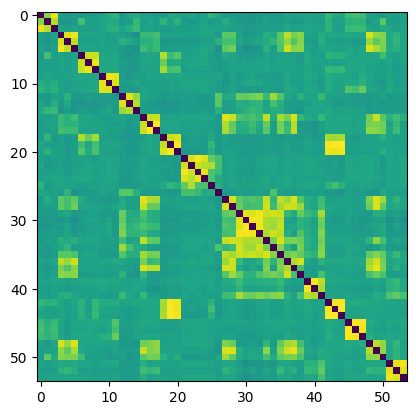

In [65]:
plt.imshow(similarities_matrix)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:00<00:00, 1071.80it/s]


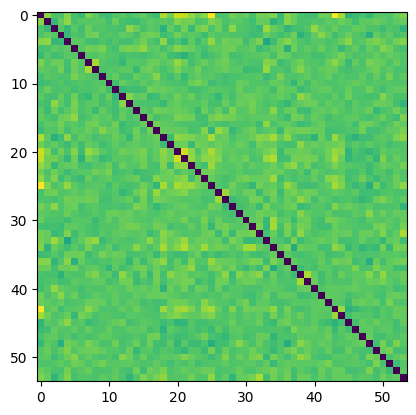

In [271]:
autoencoder_similarities_matrix = np.zeros((len(query_with_autoencoder_embeddings), len(query_with_autoencoder_embeddings)))
for idx, elem in enumerate(tqdm(query_with_autoencoder_embeddings)):
    for other_idx, other_elem in enumerate(query_with_autoencoder_embeddings):
        if idx != other_idx:
            autoencoder_similarities_matrix[idx, other_idx] = torch.nn.CosineSimilarity(dim=0)(elem['embedding'], other_elem['embedding']) + 1
            # autoencoder_similarities_matrix[idx, other_idx] =  -torch.nn.PairwiseDistance(p=2)(elem['embedding'], other_elem['embedding'])
            
plt.imshow(autoencoder_similarities_matrix)

In [68]:
similarities_matrix = np.zeros((len(query_with_embeddings), len(gallery_with_embeddings)))
for query_idx, query_elem in enumerate(tqdm(query_with_embeddings)):
    for gallery_idx, gallery_elem in enumerate(gallery_with_embeddings):
        similarities_matrix[query_idx, gallery_idx] = pairwise_similarity(query_elem['embedding'], gallery_elem['embedding'])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:01<00:00, 42.50it/s]


In [241]:
label_to_acc = defaultdict(list)
label_to_map = defaultdict(list)
for idx, query_elem in enumerate(query_with_embeddings):
    similarities = similarities_matrix[idx]
    best_indices = (-similarities).argsort()[:10]
    elem_label = query_elem['label']
    cur_acc = []
    cur_map_sum = 0
    cur_map_denominator = 0
    for i, other_idx in enumerate(best_indices):
        other_label = gallery_with_embeddings[other_idx]['label']
        is_equal = elem_label == other_label
        cur_acc.append(is_equal)
        cur_map_sum += is_equal / (i + 1)
        cur_map_denominator += 1 / (i + 1)
        
    label_to_acc[elem_label].append(np.mean(cur_acc))
    label_to_map[elem_label].append(cur_map_sum / cur_map_denominator)

print('Accuracy at top 10:')
for label, results in sorted(label_to_acc.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    print(f'{label}: {np.mean(results):.2%}')
    
print()
    
print('mAP at top 10:')
for label, results in sorted(label_to_map.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    print(f'{label}: {np.mean(results):.2}')
    
acc = []
mAP = []
for label, results in sorted(label_to_acc.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    acc.append(np.mean(results))
    
for label, results in sorted(label_to_map.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    mAP.append(np.mean(results))
    
print()
print(f'Mean accuracy at top 10: {np.mean(acc):0.2%}')
print(f'Mean mAP at top 10: {np.mean(mAP):0.2}')

Accuracy at top 10:
banana: 100.00%
bus: 100.00%
giraffe: 100.00%
motorcycle: 100.00%
zebra: 100.00%
broccoli: 93.33%
umbrella: 86.67%
person: 83.33%
elephant: 73.33%
hot dog: 60.00%
cat: 56.67%
bear: 50.00%
sheep: 46.67%
horse: 43.33%
donut: 40.00%
cow: 30.00%
potted plant: 23.33%
dog: 10.00%

mAP at top 10:
banana: 1.0
bus: 1.0
giraffe: 1.0
motorcycle: 1.0
zebra: 1.0
broccoli: 0.93
umbrella: 0.89
person: 0.86
elephant: 0.72
hot dog: 0.59
cat: 0.51
sheep: 0.47
bear: 0.43
donut: 0.4
horse: 0.4
cow: 0.34
potted plant: 0.25
dog: 0.07

Mean accuracy at top 10: 66.48%
Mean mAP at top 10: 0.66


In [152]:
acc = []
mAP = []
for label, results in sorted(label_to_acc.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    acc.append(np.mean(results))
    
for label, results in sorted(label_to_map.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    mAP.append(np.mean(results))
    
print(f'Mean accuracy at top 10: {np.mean(acc):0.2%}')
print(f'Mean mAP at top 10: {np.mean(mAP):0.2}')

Mean accuracy at top 10: 66.48%
Mean mAP at top 10: 0.66


In [278]:
autoencoder_similarities_matrix = np.zeros((len(query_with_autoencoder_embeddings), len(gallery_with_autoencoder_embeddings)))
for query_idx, query_elem in enumerate(tqdm(query_with_autoencoder_embeddings)):
    for gallery_idx, gallery_elem in enumerate(gallery_with_autoencoder_embeddings):
        autoencoder_similarities_matrix[query_idx, gallery_idx] = torch.nn.CosineSimilarity(dim=0)(query_elem['embedding'], gallery_elem['embedding']) + 1
        # autoencoder_similarities_matrix[query_idx, gallery_idx] = -torch.nn.PairwiseDistance(p=1)(query_elem['embedding'], gallery_elem['embedding'])

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 54/54 [00:02<00:00, 23.31it/s]


In [279]:
label_to_acc = defaultdict(list)
label_to_map = defaultdict(list)
for idx, query_elem in enumerate(query_with_autoencoder_embeddings):
    similarities = autoencoder_similarities_matrix[idx]
    best_indices = (-similarities).argsort()[:10]
    elem_label = query_elem['label']
    cur_acc = []
    cur_map_sum = 0
    cur_map_denominator = 0
    for i, other_idx in enumerate(best_indices):
        other_label = gallery_with_autoencoder_embeddings[other_idx]['label']
        is_equal = elem_label == other_label
        cur_acc.append(is_equal)
        cur_map_sum += is_equal / (i + 1)
        cur_map_denominator += 1 / (i + 1)
        
    label_to_acc[elem_label].append(np.mean(cur_acc))
    label_to_map[elem_label].append(cur_map_sum / cur_map_denominator)

print('Accuracy at top 10:')
for label, results in sorted(label_to_acc.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    print(f'{label}: {np.mean(results):.2%}')
    
print()
    
print('mAP at top 10:')
for label, results in sorted(label_to_map.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    print(f'{label}: {np.mean(results):.2}')
    
acc = []
mAP = []
for label, results in sorted(label_to_acc.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    acc.append(np.mean(results))
    
for label, results in sorted(label_to_map.items(), key=lambda item: (-np.mean(item[1]), item[0])):
    mAP.append(np.mean(results))

print()
print(f'Mean accuracy at top 10: {np.mean(acc):0.2%}')
print(f'Mean mAP at top 10: {np.mean(mAP):0.2}')

Accuracy at top 10:
banana: 63.33%
broccoli: 40.00%
donut: 20.00%
umbrella: 20.00%
bear: 16.67%
bus: 16.67%
cat: 13.33%
elephant: 13.33%
hot dog: 13.33%
dog: 10.00%
sheep: 10.00%
cow: 6.67%
horse: 6.67%
potted plant: 6.67%
zebra: 3.33%
giraffe: 0.00%
motorcycle: 0.00%
person: 0.00%

mAP at top 10:
banana: 0.64
broccoli: 0.52
elephant: 0.3
bus: 0.29
hot dog: 0.24
cat: 0.24
bear: 0.18
umbrella: 0.15
donut: 0.15
potted plant: 0.13
dog: 0.11
sheep: 0.063
cow: 0.032
horse: 0.03
zebra: 0.016
giraffe: 0.0
motorcycle: 0.0
person: 0.0

Mean accuracy at top 10: 14.44%
Mean mAP at top 10: 0.17


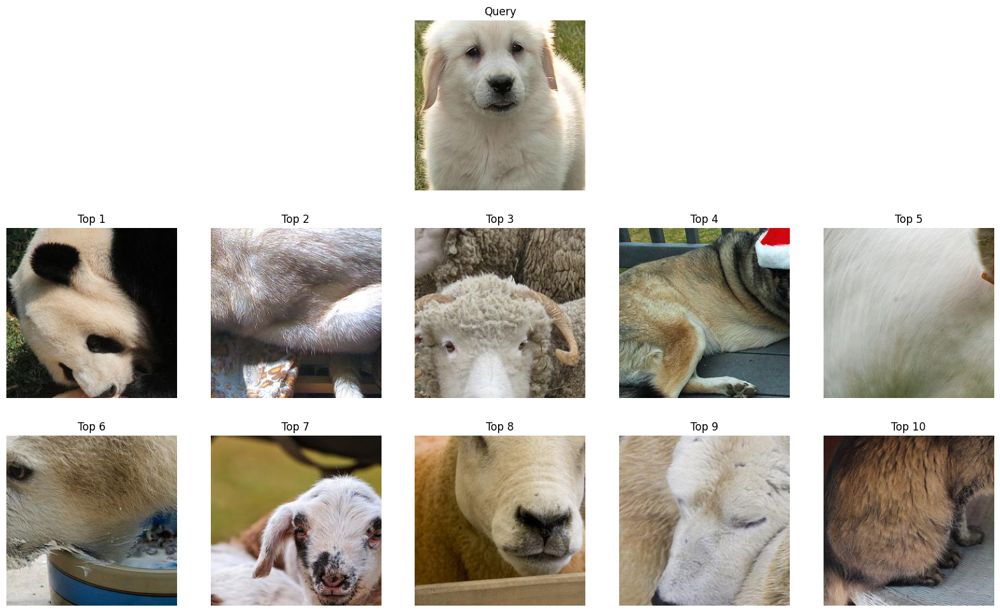

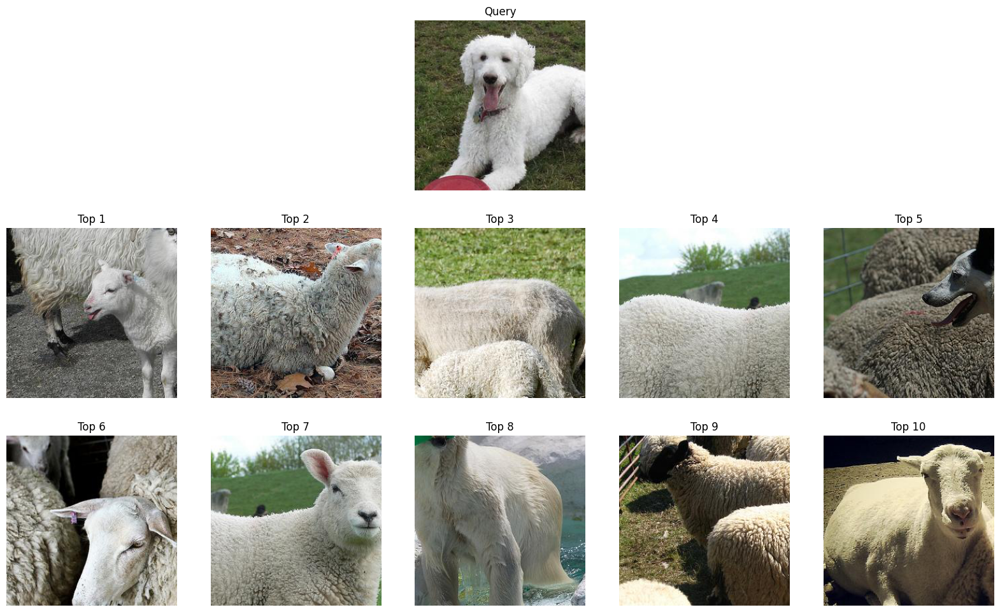

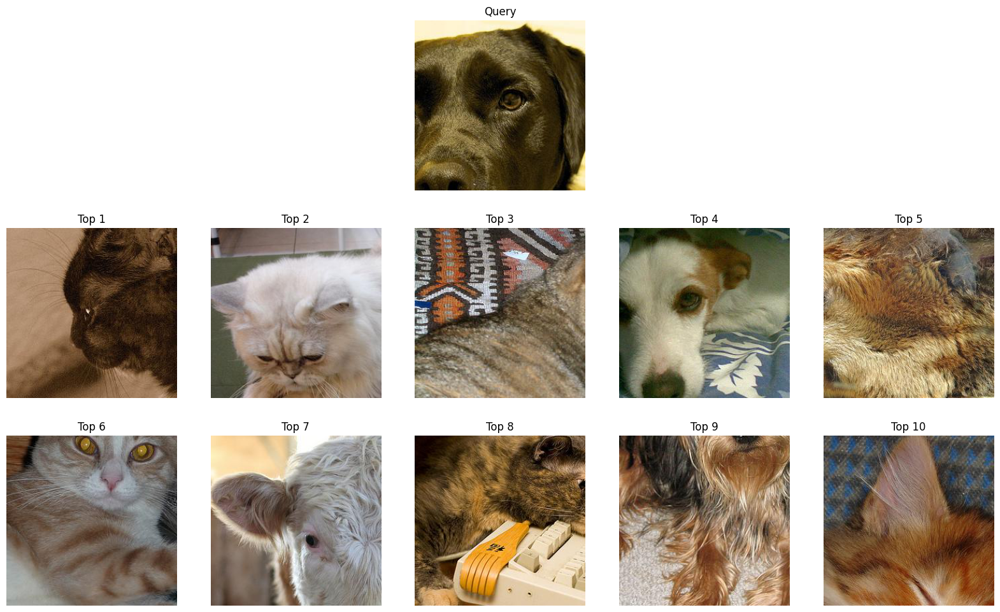

In [150]:
for idx, query_elem in enumerate(query_with_embeddings):
    elem_label = query_elem['label']
    if elem_label == 'dog':
        similarities = similarities_matrix[idx]
        best_indices = (-similarities).argsort()[:10]
        
        f, axarr = plt.subplots(3, 5)
        f.set_size_inches(20, 12)
        
        for i in range(5):
            axarr[0, i].axis('off')
        axarr[0, 2].imshow(Image.open(query_elem['image_path']))
        axarr[0, 2].set_title('Query')
        
        
        for i, result_idx in enumerate(best_indices):
            cur_ax = axarr[1 + i // 5, i % 5]
            cur_ax.imshow(Image.open(gallery_with_embeddings[result_idx]['image_path']))
            cur_ax.set_title(f'Top {i + 1}')
            cur_ax.axis('off')
        plt.show()

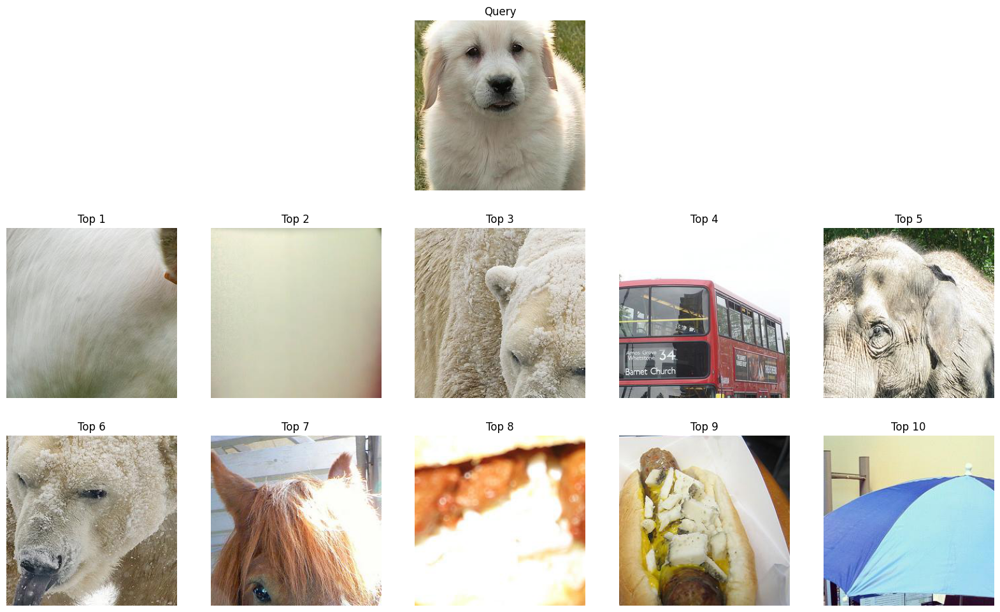

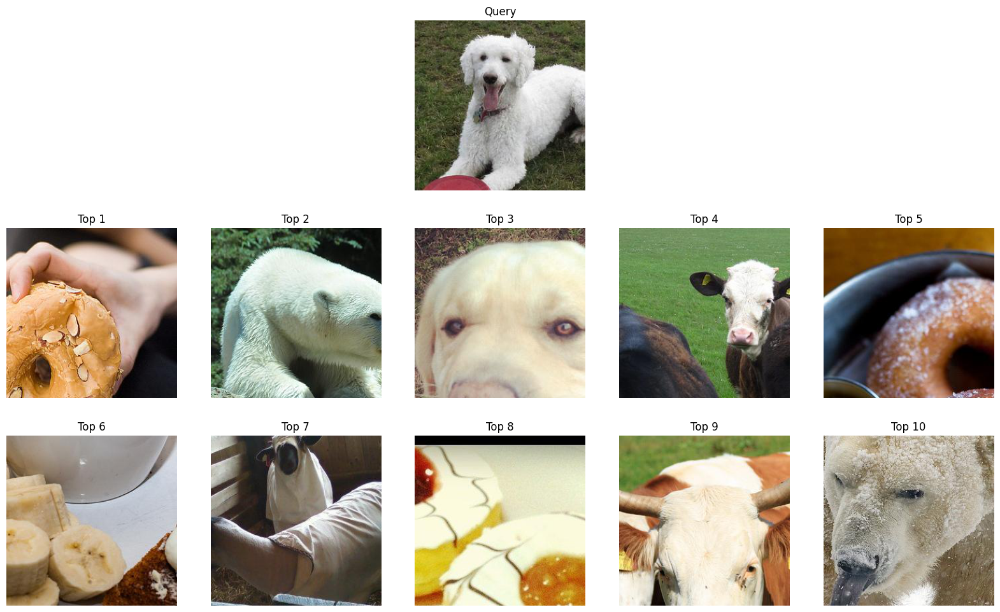

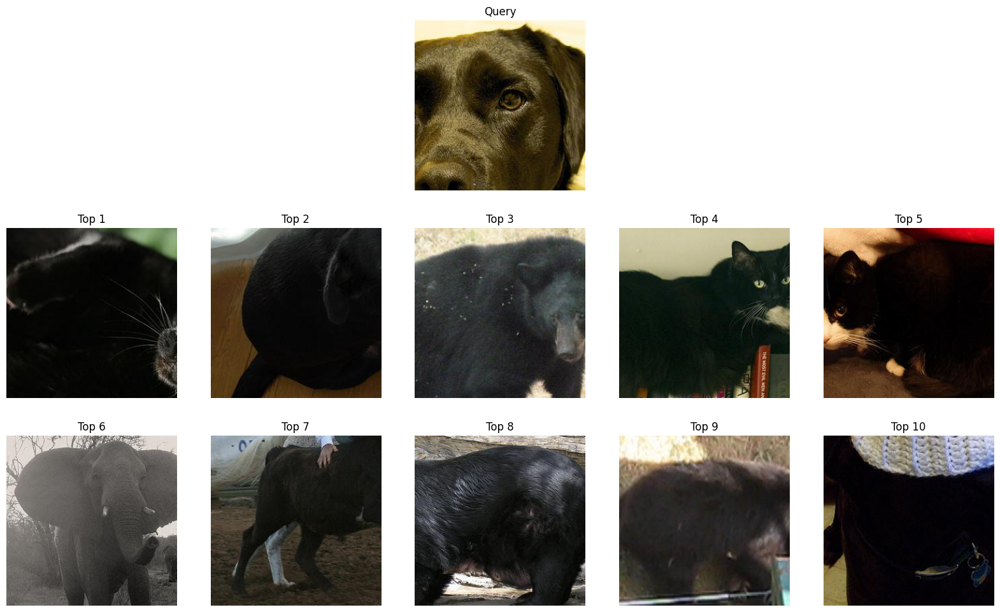

In [281]:
for idx, query_elem in enumerate(query_with_autoencoder_embeddings):
    elem_label = query_elem['label']
    if elem_label == 'dog':
        similarities = autoencoder_similarities_matrix[idx]
        best_indices = (-similarities).argsort()[:10]
        
        f, axarr = plt.subplots(3, 5)
        f.set_size_inches(20, 12)
        
        for i in range(5):
            axarr[0, i].axis('off')
        axarr[0, 2].imshow(Image.open(query_elem['image_path']))
        axarr[0, 2].set_title('Query')
        
        
        for i, result_idx in enumerate(best_indices):
            cur_ax = axarr[1 + i // 5, i % 5]
            cur_ax.imshow(Image.open(gallery_with_autoencoder_embeddings[result_idx]['image_path']))
            cur_ax.set_title(f'Top {i + 1}')
            cur_ax.axis('off')
        plt.show()

In [257]:
embeddings = np.array(list(map(lambda x: x['embedding'].numpy()[0, :], gallery_with_embeddings)))
embeddings_tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3, metric='cosine').fit_transform(embeddings)

In [272]:
autoencoder_embeddings = np.array(list(map(lambda x: x['embedding'].numpy(), gallery_with_autoencoder_embeddings)))
autoencoder_embeddings_tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3, metric='cosine').fit_transform(autoencoder_embeddings)

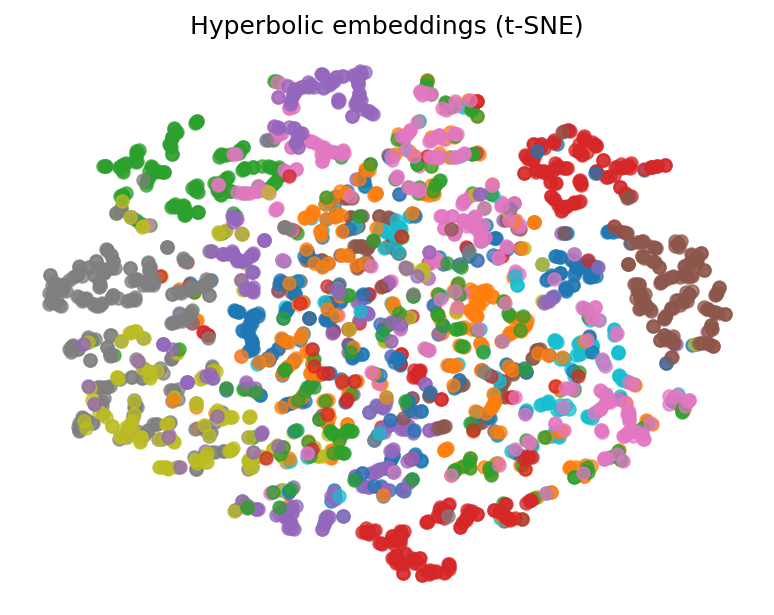

In [274]:
label_to_x = defaultdict(list)
label_to_y = defaultdict(list)
for idx, elem in enumerate(gallery_with_embeddings):
    label_to_x[elem['label']].append(embeddings_tsne[idx, 0])
    label_to_y[elem['label']].append(embeddings_tsne[idx, 1])
    
fig = plt.figure()
fig.set_dpi(150)
plt.title('Hyperbolic embeddings (t-SNE)')
for label in label_to_x.keys():
    plt.scatter(label_to_x[label], label_to_y[label], alpha=0.7, label=label)

# plt.legend()
plt.axis('off')
plt.show()

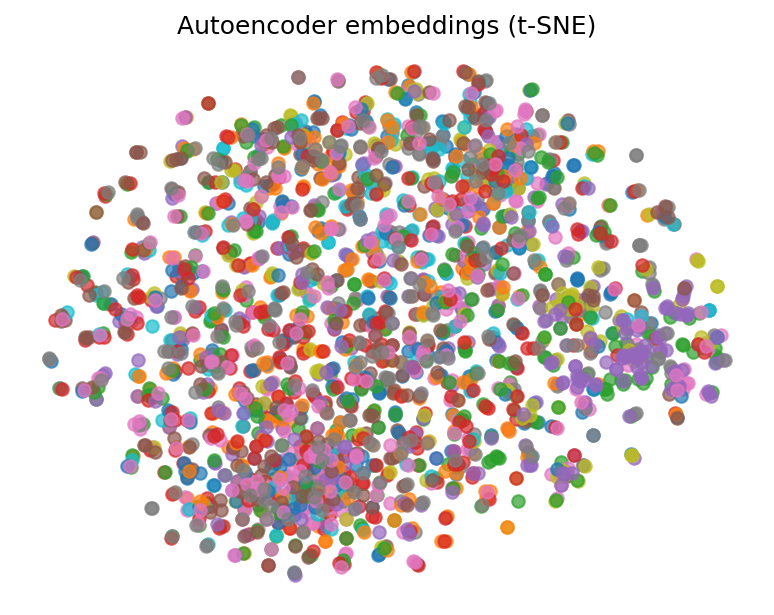

In [275]:
label_to_x = defaultdict(list)
label_to_y = defaultdict(list)
for idx, elem in enumerate(gallery_with_autoencoder_embeddings):
    label_to_x[elem['label']].append(autoencoder_embeddings_tsne[idx, 0])
    label_to_y[elem['label']].append(autoencoder_embeddings_tsne[idx, 1])
    
fig = plt.figure()
fig.set_dpi(150)
plt.title('Autoencoder embeddings (t-SNE)')
for label in label_to_x.keys():
    plt.scatter(label_to_x[label], label_to_y[label], alpha=0.7, label=label)

# plt.legend()
plt.axis('off')
plt.show()

In [245]:
X = np.array([[0, 0, 0], [0, 1, 1], [1, 0, 1], [1, 1, 1]])
X_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3, metric='cosine').fit_transform(X)